# WhatsApp Chat Analysis with Python

Before starting with the task of WhatsApp Chat analysis with Python you need to extract your WhatsApp data from your smartphone which is a very easy task. To extract your WhatsApp chats, just open any chat with a person or a group and follow the steps mentioned below:

1. If you are having an iPhone then tap on the Contact Name or the Group Name. In case you are having an Android smartphone then tap on the 3 dots above.
2. Then scroll to the bottom and top on Export Chat.
3. Then select without media for simplicity if it asks you whether you want your chats with or without media.
4. Then email this chat to yourself and download it to your system.

### Import Python Libraries 

In [1]:
! pip install emoji

In [2]:
import regex
import pandas as pd
import numpy as np
import emoji
from collections import Counter
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
print('Libraries Imported')

Libraries Imported


### Prepare the data

In [3]:
def date_time(s):
    pattern = '^([0-9]+)(\/)([0-9]+)(\/)([0-9]+), ([0-9]+):([0-9]+)[ ]?(AM|PM|am|pm)? -'
    result = regex.match(pattern, s)
    if result:
        return True
    return False

def find_author(s):
    s = s.split(":")
    if len(s)==2:
        return True
    else:
        return False

def getDatapoint(line):
    splitline = line.split(' - ')
    dateTime = splitline[0]
    date, time = dateTime.split(", ")
    message = " ".join(splitline[1:])
    if find_author(message):
        splitmessage = message.split(": ")
        author = splitmessage[0]
        message = " ".join(splitmessage[1:])
    else:
        author= None
    return date, time, author, message

### Import the data

In [4]:
data = []
conversation = 'C:/Users/Arvind/Desktop/WhatsApp Chat Analysis/Dataset/WhatsApp Chat with Football Freaks.txt'
with open(conversation, encoding="utf-8") as fp:
    fp.readline()
    messageBuffer = []
    date, time, author = None, None, None
    while True:
        line = fp.readline()
        if not line:
            break
        line = line.strip()
        if date_time(line):
            if len(messageBuffer) > 0:
                data.append([date, time, author, ' '.join(messageBuffer)])
            messageBuffer.clear()
            date, time, author, message = getDatapoint(line)
            messageBuffer.append(message)
        else:
            messageBuffer.append(line)

Our dataset is completely ready now for the task of WhatsApp chat analysis with Python. Now let’s have a look at the last 20 messages and some other insights from the data:

In [5]:
df = pd.DataFrame(data, columns=["Date", 'Time', 'Author', 'Message'])
df['Date'] = pd.to_datetime(df['Date'])
print(df.tail(20))
print(df.info())
print(df.Author.unique())

            Date      Time           Author  \
25603 2021-05-18  11:23 AM  +91 93992 13229   
25604 2021-05-18  11:24 AM  +91 93992 13229   
25605 2021-05-18  11:24 AM  +91 93401 84470   
25606 2021-05-18  11:24 AM  +91 93401 84470   
25607 2021-05-18  11:24 AM  +91 93992 13229   
25608 2021-05-18  11:24 AM  +91 93401 84470   
25609 2021-05-18  11:24 AM  +91 93992 13229   
25610 2021-05-18  11:25 AM  +91 93401 84470   
25611 2021-05-18  11:25 AM  +91 93401 84470   
25612 2021-05-18  11:25 AM  +91 93401 84470   
25613 2021-05-18  11:25 AM  +91 93401 84470   
25614 2021-05-18  11:25 AM  +91 93401 84470   
25615 2021-05-18  11:27 AM  +91 93992 13229   
25616 2021-05-18   1:53 PM  +91 88390 50511   
25617 2021-05-18   1:53 PM  +91 88390 50511   
25618 2021-05-18   1:53 PM  +91 88390 50511   
25619 2021-05-18   1:58 PM  +91 89891 22110   
25620 2021-05-18   2:03 PM  +91 93401 84470   
25621 2021-05-18   2:04 PM  +91 70499 93434   
25622 2021-05-18   2:05 PM  +91 93401 84470   

            

Now let’s have a look at the total number of messages between this WhatsApp chat:

In [6]:
total_messages = df.shape[0]
print(total_messages)

25623


Now let’s have a look at the total number of media messages present in this chat:

In [7]:
media_messages = df[df["Message"]=='<Media omitted>'].shape[0]
print(media_messages)

5459


Now let’s extract the emojis present in between the chats and have a look at the emojis present in this chat:

In [8]:
def split_count(text):
    emoji_list = []
    data = regex.findall(r"\X", text)
    for word in data:
        if any(char in emoji.UNICODE_EMOJI for char in word):
            emoji_list.append(word)
    return emoji_list

df["emoji"] = df["Message"].apply(split_count)

emojis = sum(df["emoji"].str.len())
print(emojis)

0


Now let’s extract the URLs present in this chat and have a look at the final insights:

In [9]:
URLPATTERN = r'(https?://\S+)'
df['urlcount'] = df.Message.apply(lambda x: regex.findall(URLPATTERN, x)).str.len()
links = np.sum(df.urlcount)

print("Chats between Football Freaks")
print("Total Messages: ", total_messages)
print("Number of Media Shared: ", media_messages)
print("Number of Emojis Shared", emojis)
print("Number of Links Shared", links)

Chats between Football Freaks
Total Messages:  25623
Number of Media Shared:  5459
Number of Emojis Shared 0
Number of Links Shared 355


Now let’s prepare this data to get more insights to analyze all the messages sent in this chat in more detail:

In [10]:
media_messages_df = df[df['Message'] == '<Media omitted>']
messages_df = df.drop(media_messages_df.index)
messages_df['Letter_Count'] = messages_df['Message'].apply(lambda s : len(s))
messages_df['Word_Count'] = messages_df['Message'].apply(lambda s : len(s.split(' ')))
messages_df["MessageCount"]=1

l = ['+91 88786 89656','+91 70499 93434','+91 95843 22247','Sameer Bhaiya','+91 97525 43500','Ankit Bhaiya',
     '+91 99770 81757','+91 98276 19108','+91 94245 83278','+91 93401 84470','+91 98268 25373',
     '+91 88394 27577','+91 98260 33004','+91 93402 43800','+91 88390 50511','+91 93992 13229',
     'DND','+91 94259 99992','+91 99819 37827','+91 81039 99679','+91 99775 85052','+91 80850 79978',
     '+91 77709 82814','+91 79993 19630','+91 91115 51116','+91 74703 88167','Yash Sharma(2nd Year Footballer)',
     '+91 91791 72464','Sachin Murkute','+91 70000 68140','+91 86020 39496','+91 94066 66754','+91 82250 17488',
     '+91 88898 74446','Vishal Patidar','+91 82696 51050','+91 93998 22949','+91 79996 28080','+91 89826 11640',
     '+91 90091 36555','+91 77568 63222','+91 82260 61616','+91 99812 84007','+91 89821 15770','+91 73894 99207',
     '+91 6266 215 916','+91 88188 00414','+91 94798 68553','+91 88714 02404','+91 99078 77677','+91 91110 15551',
     '+91 96307 62219','+91 77228 76305','+91 73898 19845','+91 99779 65599','+91 87208 26422','+91 96733 36087',
     '+91 89628 12199','+91 89891 22110','+91 83195 18705','+91 98938 24874','+91 88399 55906']
for i in range(len(l)):
    # Filtering out messages of particular user
    req_df= messages_df[messages_df["Author"] == l[i]]
    # req_df will contain messages of only one particular user
    print(f'Stats of {l[i]} -')
    # shape will print number of rows which indirectly means the number of messages
    print('Messages Sent', req_df.shape[0])
    #Word_Count contains of total words in one message. Sum of all words/ Total Messages will yield words per message
    words_per_message = (np.sum(req_df['Word_Count']))/req_df.shape[0]
    print('Average Words per message', words_per_message)
    #media conists of media messages
    media = media_messages_df[media_messages_df['Author'] == l[i]].shape[0]
    print('Media Messages Sent', media)
    # emojis conists of total emojis
    emojis = sum(req_df['emoji'].str.len())
    print('Emojis Sent', emojis)
    #links consist of total links
    links = sum(req_df["urlcount"])   
    print('Links Sent', links)
    print('\n')

Stats of +91 88786 89656 -
Messages Sent 749
Average Words per message 4.411214953271028
Media Messages Sent 60
Emojis Sent 0
Links Sent 2


Stats of +91 70499 93434 -
Messages Sent 1162
Average Words per message 6.654044750430293
Media Messages Sent 266
Emojis Sent 0
Links Sent 1


Stats of +91 95843 22247 -
Messages Sent 177
Average Words per message 7.028248587570621
Media Messages Sent 130
Emojis Sent 0
Links Sent 0


Stats of Sameer Bhaiya -
Messages Sent 1736
Average Words per message 3.8058755760368665
Media Messages Sent 1166
Emojis Sent 0
Links Sent 1


Stats of +91 97525 43500 -
Messages Sent 19
Average Words per message 6.105263157894737
Media Messages Sent 4
Emojis Sent 0
Links Sent 1


Stats of Ankit Bhaiya -
Messages Sent 1700
Average Words per message 7.065294117647059
Media Messages Sent 632
Emojis Sent 0
Links Sent 5


Stats of +91 99770 81757 -
Messages Sent 868
Average Words per message 8.52073732718894
Media Messages Sent 325
Emojis Sent 0
Links Sent 1


Stats of +9

Now let’s prepare a visualization of the total emojis present in the chat and the type of emojis sent between the two people. It will help in understanding the relationship between both the people:

In [11]:
total_emojis_list = list(set([a for b in messages_df.emoji for a in b]))
total_emojis = len(total_emojis_list)

total_emojis_list = list([a for b in messages_df.emoji for a in b])
emoji_dict = dict(Counter(total_emojis_list))
emoji_dict = sorted(emoji_dict.items(), key=lambda x: x[1], reverse=True)
for i in emoji_dict:
  print(i)
  
emoji_df = pd.DataFrame(emoji_dict, columns=['emoji', 'count'])
import plotly.express as px
fig = px.pie(emoji_df, values='count', names='emoji')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

Now let’s have a look at the most used words in this WhatsApp chat by visualizing a word cloud:

There are 602168 words in all the messages.


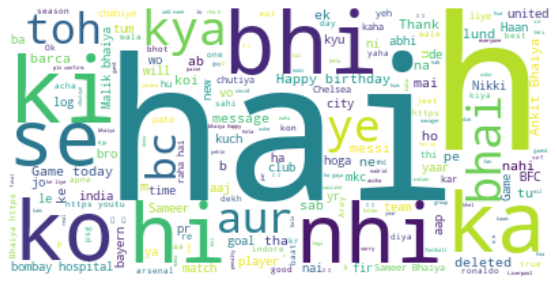

In [12]:
text = " ".join(review for review in messages_df.Message)
print ("There are {} words in all the messages.".format(len(text)))
stopwords = set(STOPWORDS)
# Generate a word cloud image
wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)
# Display the generated image:
# the matplotlib way:
plt.figure( figsize=(10,5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

Now let’s have a look at the most used words by each person by visualizing two different word clouds:

Author name +91 88786 89656


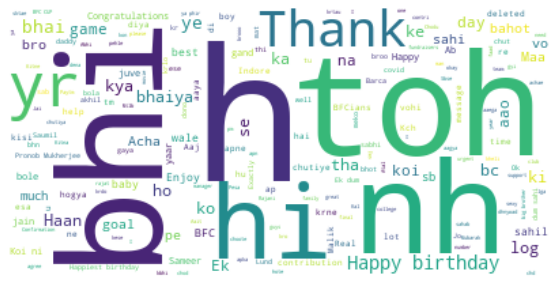

Author name +91 70499 93434


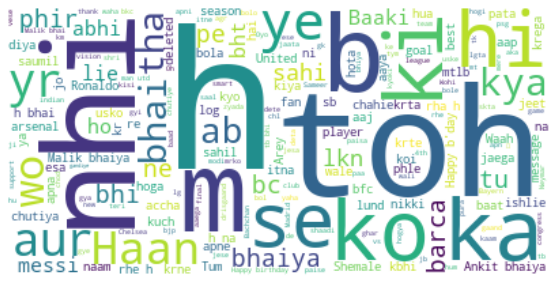

Author name +91 95843 22247


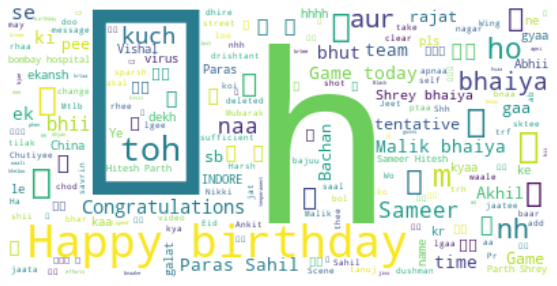

Author name Sameer Bhaiya


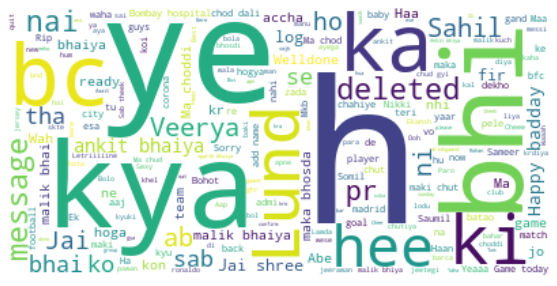

Author name +91 97525 43500


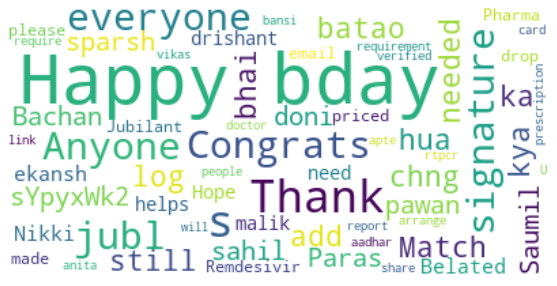

Author name Ankit Bhaiya


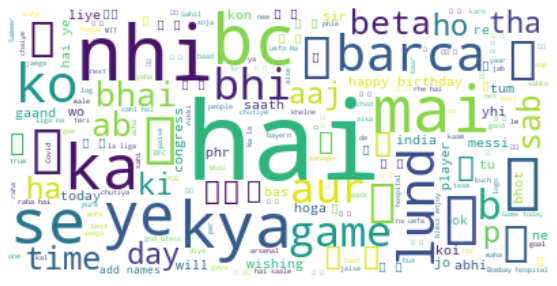

Author name +91 99770 81757


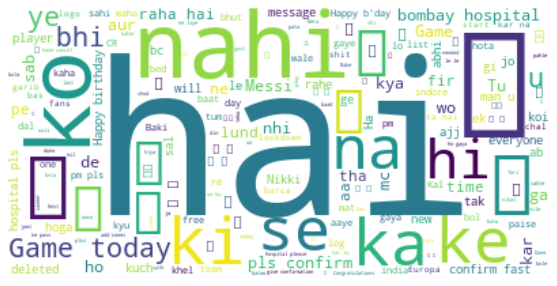

Author name +91 98276 19108


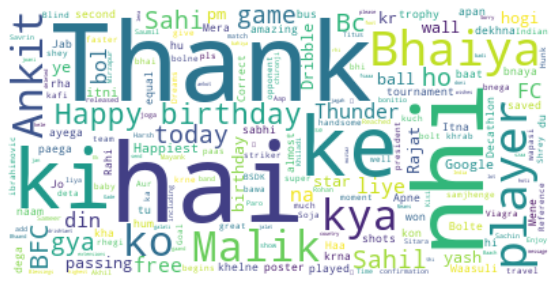

Author name +91 94245 83278


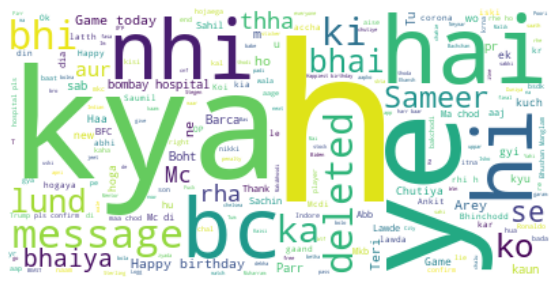

Author name +91 93401 84470


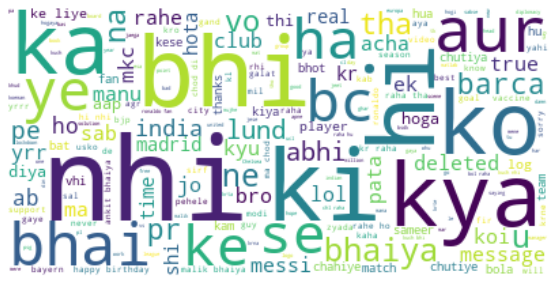

Author name +91 98268 25373


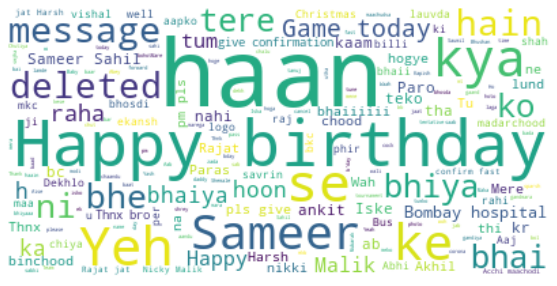

Author name +91 88394 27577


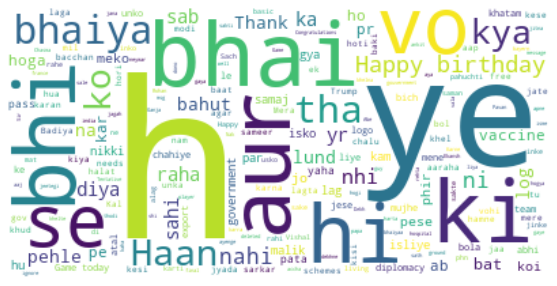

Author name +91 98260 33004


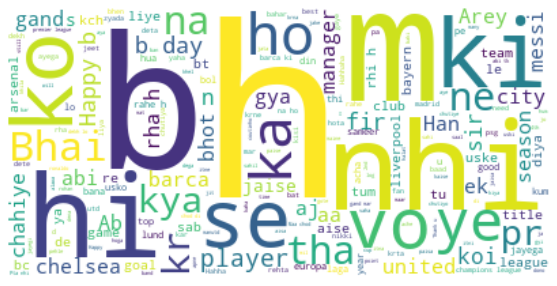

Author name +91 93402 43800


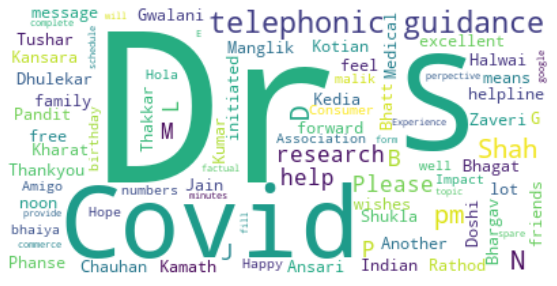

Author name +91 88390 50511


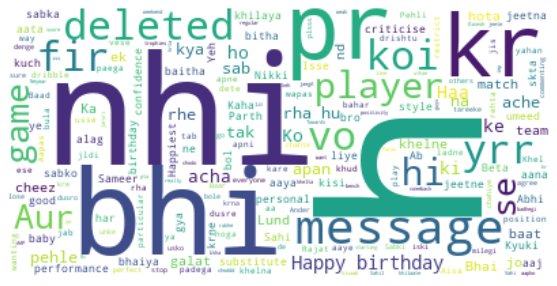

Author name +91 93992 13229


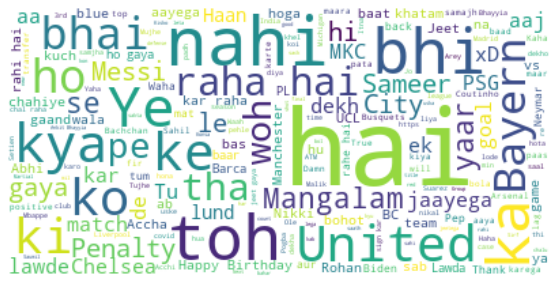

Author name DND


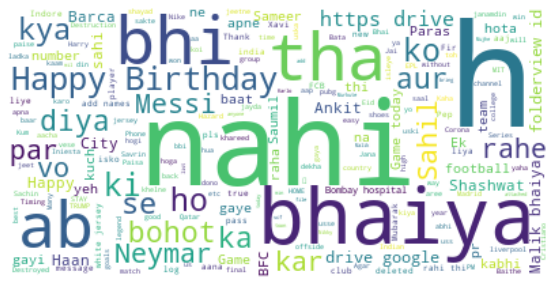

Author name +91 94259 99992


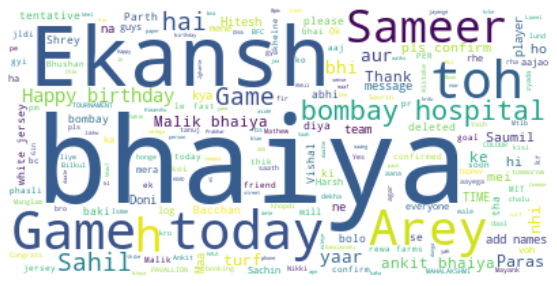

Author name +91 99819 37827


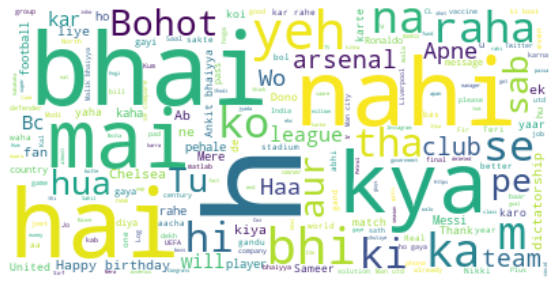

Author name +91 81039 99679


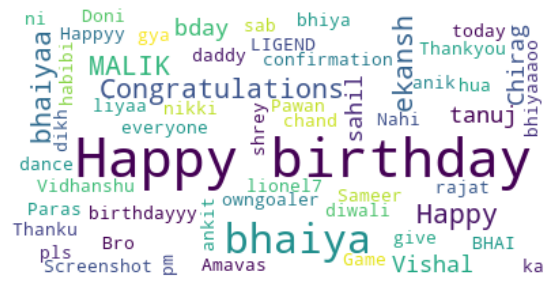

Author name +91 99775 85052


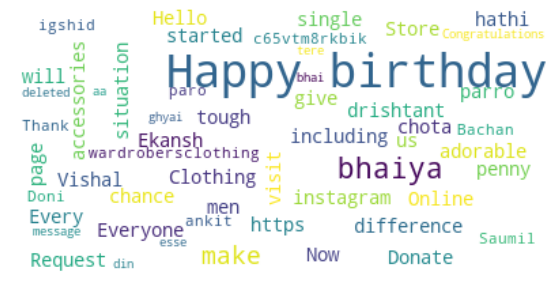

Author name +91 80850 79978


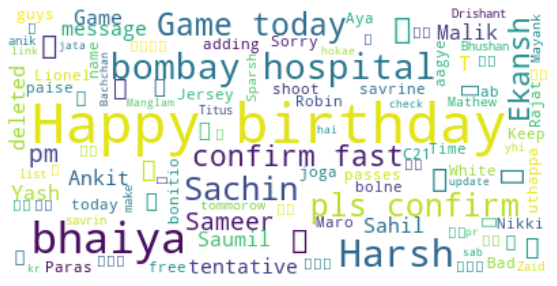

Author name +91 77709 82814


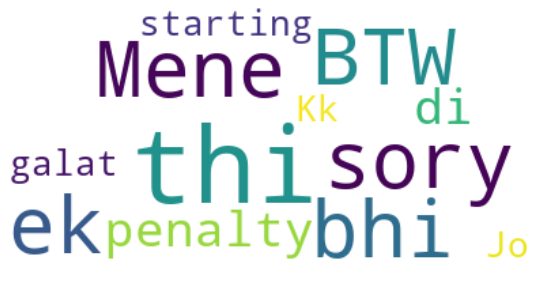

Author name +91 79993 19630


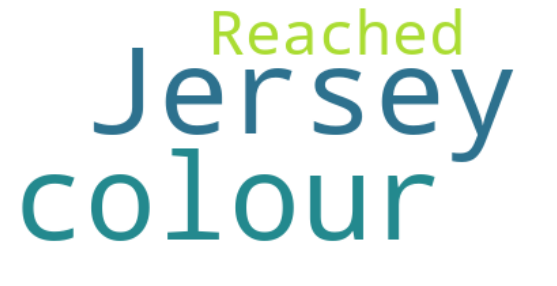

Author name +91 74703 88167


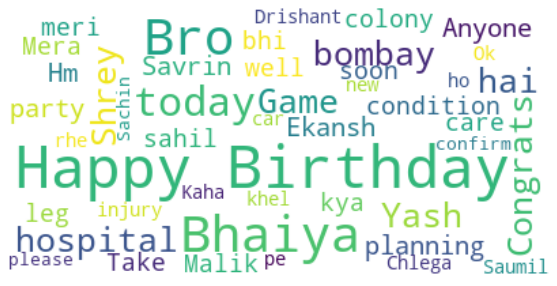

Author name Yash Sharma(2nd Year Footballer)


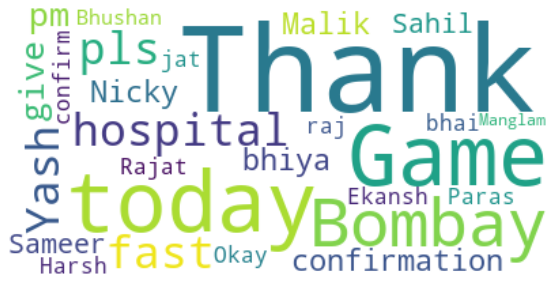

Author name +91 91791 72464


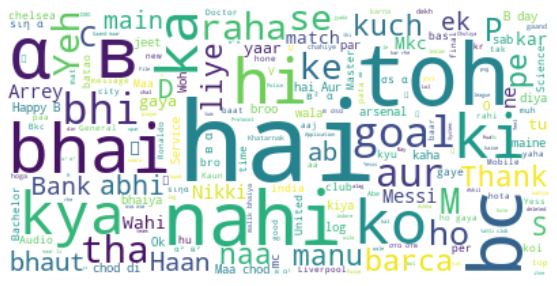

Author name Sachin Murkute


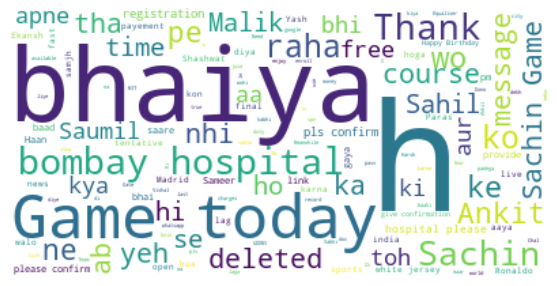

Author name +91 70000 68140


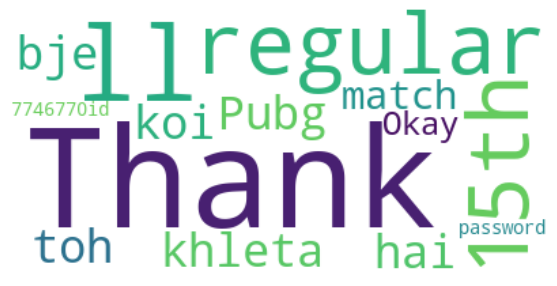

Author name +91 86020 39496


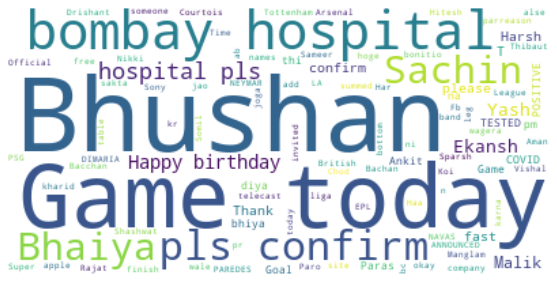

Author name +91 94066 66754


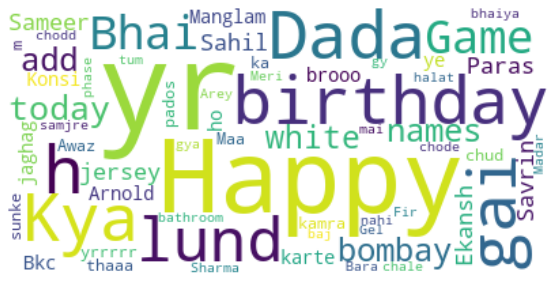

Author name +91 82250 17488


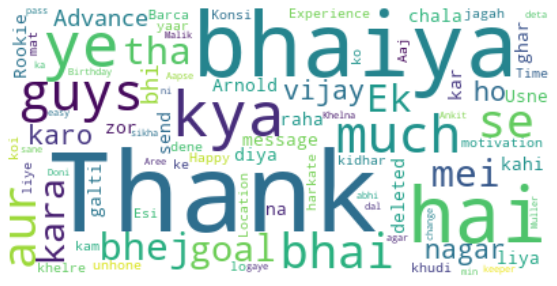

Author name +91 88898 74446


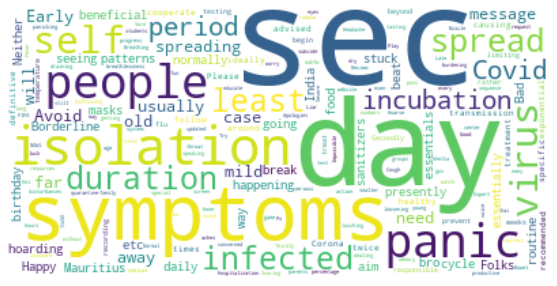

Author name Vishal Patidar


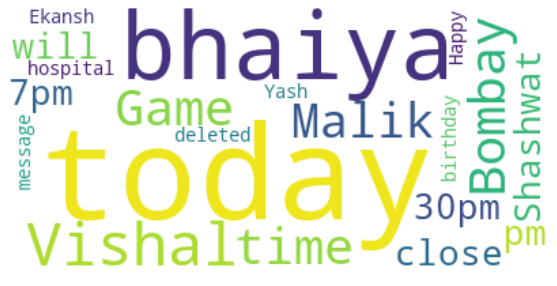

Author name +91 82696 51050


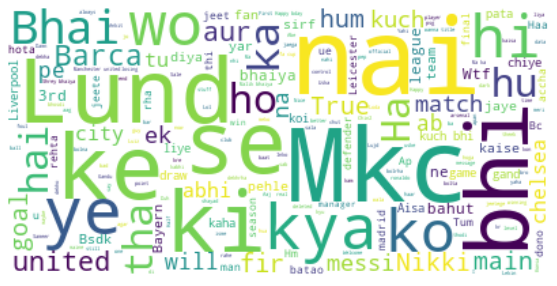

Author name +91 93998 22949


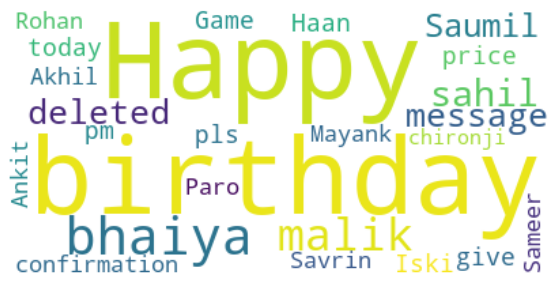

Author name +91 79996 28080


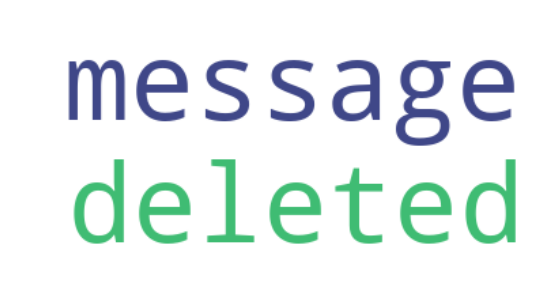

Author name +91 89826 11640


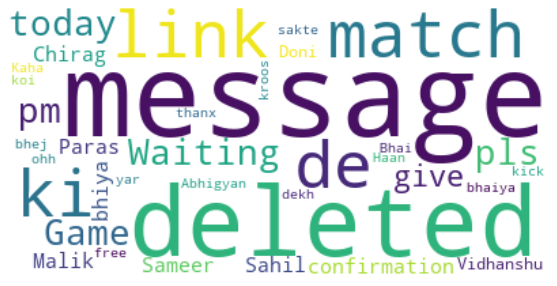

Author name +91 90091 36555


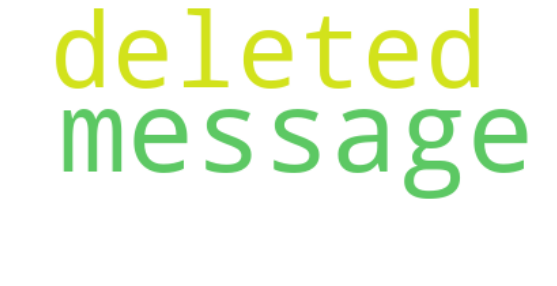

Author name +91 77568 63222


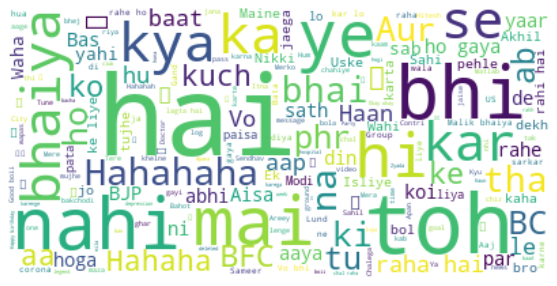

Author name +91 82260 61616


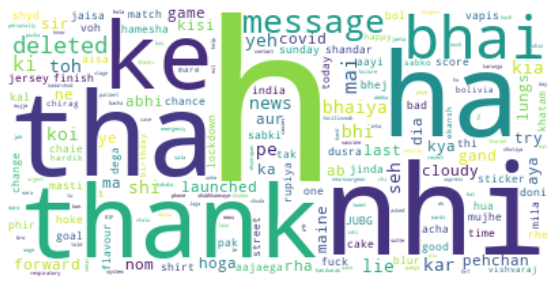

Author name +91 99812 84007


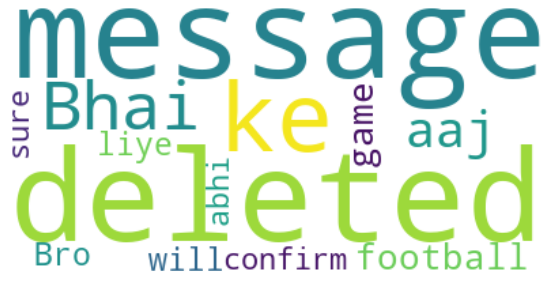

Author name +91 89821 15770


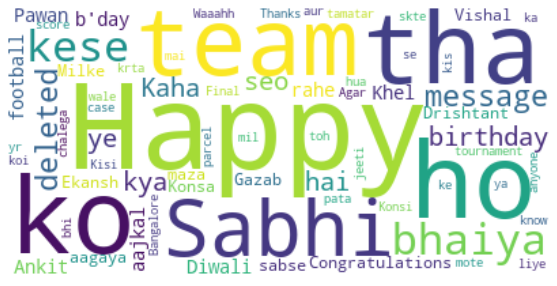

Author name +91 73894 99207


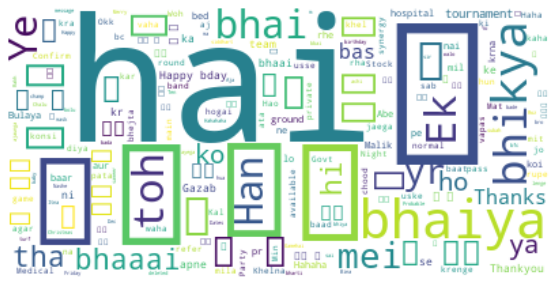

Author name +91 6266 215 916


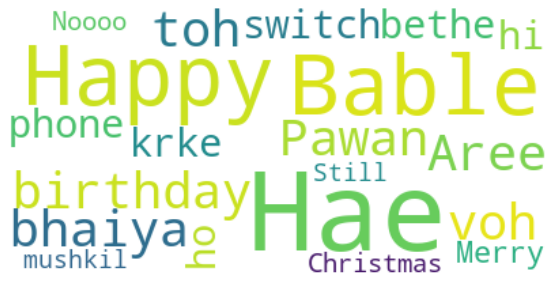

Author name +91 88188 00414


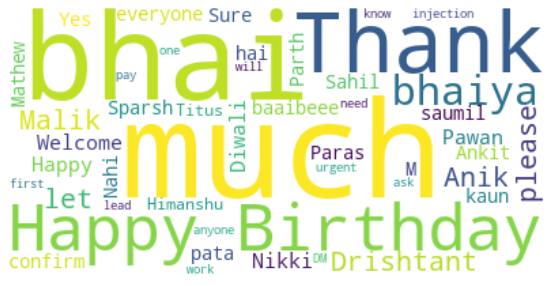

Author name +91 94798 68553


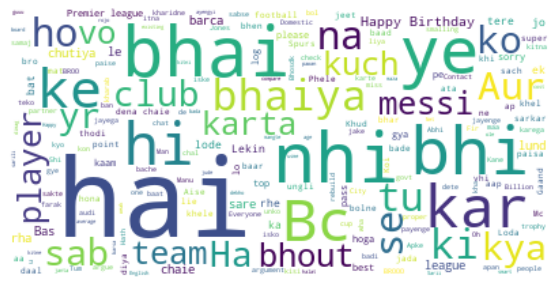

Author name +91 88714 02404


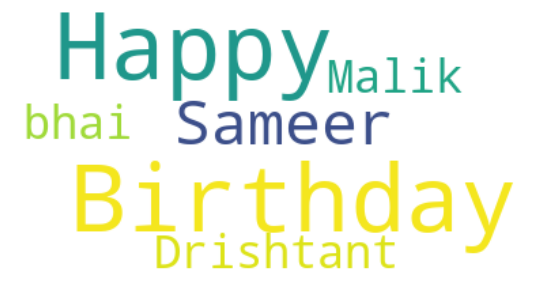

Author name +91 99078 77677


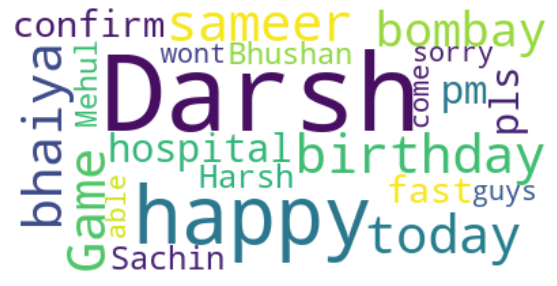

Author name +91 91110 15551


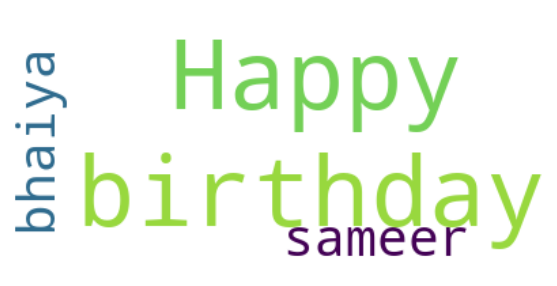

Author name +91 96307 62219


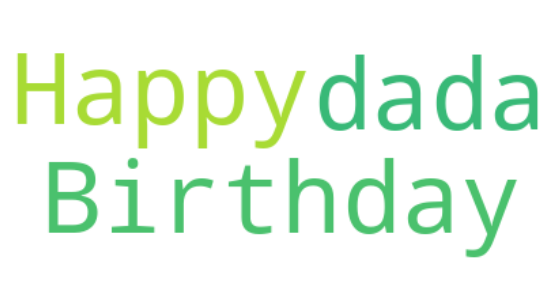

Author name +91 77228 76305


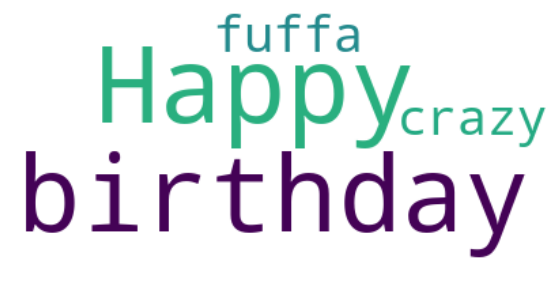

Author name +91 73898 19845


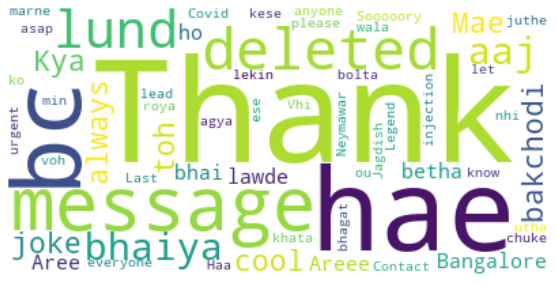

Author name +91 99779 65599


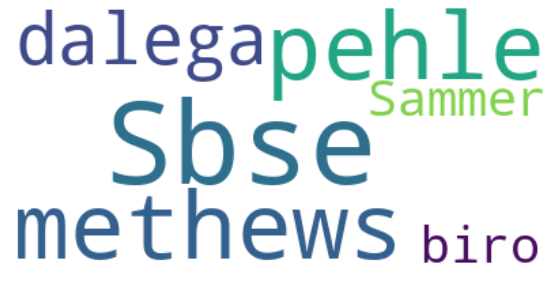

Author name +91 87208 26422


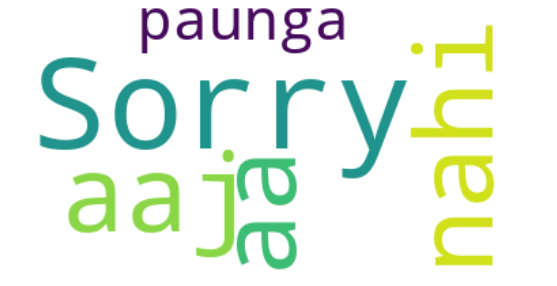

Author name +91 96733 36087


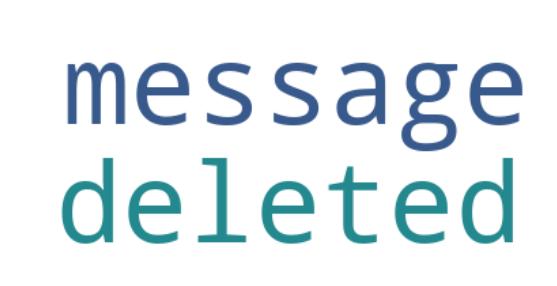

Author name +91 89628 12199


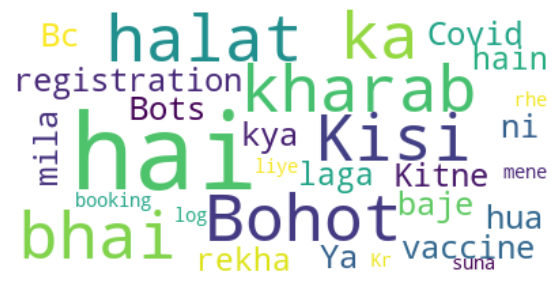

Author name +91 89891 22110


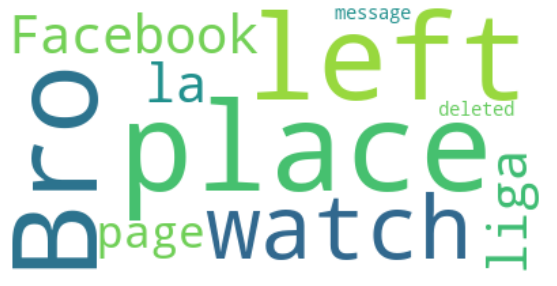

Author name +91 83195 18705


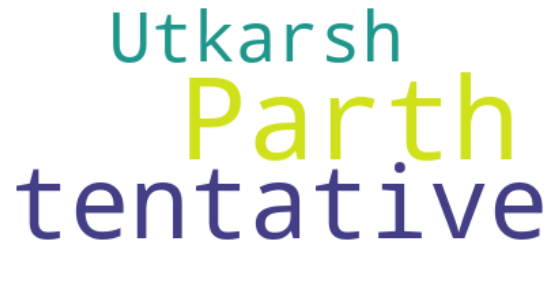

Author name +91 98938 24874


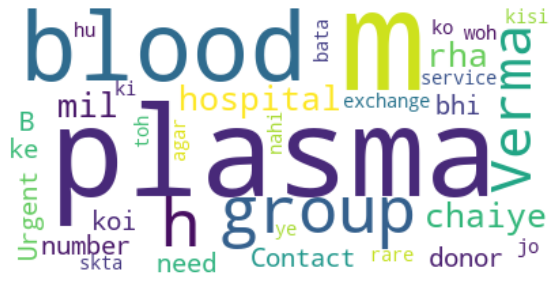

Author name +91 88399 55906


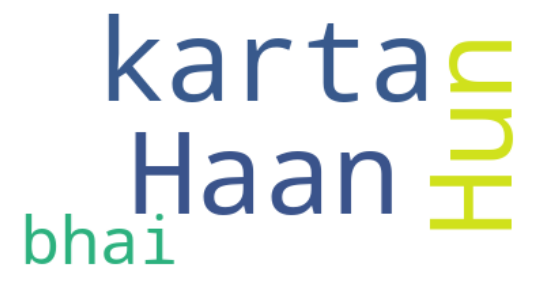

In [13]:
l = ['+91 88786 89656','+91 70499 93434','+91 95843 22247','Sameer Bhaiya','+91 97525 43500','Ankit Bhaiya',
     '+91 99770 81757','+91 98276 19108','+91 94245 83278','+91 93401 84470','+91 98268 25373',
     '+91 88394 27577','+91 98260 33004','+91 93402 43800','+91 88390 50511','+91 93992 13229',
     'DND','+91 94259 99992','+91 99819 37827','+91 81039 99679','+91 99775 85052','+91 80850 79978',
     '+91 77709 82814','+91 79993 19630','+91 74703 88167','Yash Sharma(2nd Year Footballer)',
     '+91 91791 72464','Sachin Murkute','+91 70000 68140','+91 86020 39496','+91 94066 66754','+91 82250 17488',
     '+91 88898 74446','Vishal Patidar','+91 82696 51050','+91 93998 22949','+91 79996 28080','+91 89826 11640',
     '+91 90091 36555','+91 77568 63222','+91 82260 61616','+91 99812 84007','+91 89821 15770','+91 73894 99207',
     '+91 6266 215 916','+91 88188 00414','+91 94798 68553','+91 88714 02404','+91 99078 77677','+91 91110 15551',
     '+91 96307 62219','+91 77228 76305','+91 73898 19845','+91 99779 65599','+91 87208 26422','+91 96733 36087',
     '+91 89628 12199','+91 89891 22110','+91 83195 18705','+91 98938 24874','+91 88399 55906']
for i in range(len(l)):
  dummy_df = messages_df[messages_df['Author'] == l[i]]
  text = " ".join(review for review in dummy_df.Message)
  stopwords = set(STOPWORDS)
  #Generate a word cloud image
  print('Author name',l[i])
  wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)
  #Display the generated image   
  plt.figure( figsize=(10,5))
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis("off")
  plt.show()

## Summary
So this is how we can easily analyze any WhatsApp chat between you and your friend, customer, or even a group of people. You can further use this data for many other tasks of natural language processing. 